## Variations in $Ri_f$, $Γ$

Γ is potentially a large uncertainty in $J_q^ε$. Lets try the analysis of Monismith et al (2016). Definitions:

\begin{align*}
Ri_f &= \frac{B}{B + ε} \\
Re_b &= \frac{ε}{νN^2} \\
B &= \frac{χ}{2} \frac{N^2}{T_z^2} \\
Γ &= \frac{Ri_f}{1 - Ri_f}
\end{align*}

I'm calculating these after 
1. thorpe-sorting T, S, ε, χ by ρ, 
1. then averaging to 1Hr, 
1. then fitting slopes or calculating means in 5m bins

Averaging tends to raise mean $Ri_f$ values for TIWE.

I'll look at EQUIX and TIWE.


In [1]:
%load_ext watermark
%load_ext snakeviz
%matplotlib inline


import glob
import os

import cf_xarray as cfxr
import datatree
import dcpy
import distributed
import flox.xarray
import hvplot.xarray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from dcpy.oceans import read_osu_microstructure_mat, thorpesort
from IPython.display import Image

# import eddydiff as ed
import pump

xr.set_options(keep_attrs=True)
mpl.rcParams["figure.dpi"] = 140

%watermark -iv

dcpy       : 0.2.1.dev4+g05012cc.d20220325
distributed: 2022.3.0
flox       : 0.4.0
pump       : 0.1
datatree   : 0.0.2.dev1+g2503606.d20220325
numpy      : 1.21.5
matplotlib : 3.5.1
hvplot     : 0.7.3
cf_xarray  : 0.7.0
xarray     : 2022.3.0



In [2]:
equix_ = xr.load_dataset(os.path.expanduser("~/datasets/microstructure/osu/equix.nc"))
equix_.attrs["name"] = "EQUIX"
tiwe_ = (
    xr.load_dataset(os.path.expanduser("~/datasets/microstructure/osu/tiwe.nc"))
    .drop_vars(["latitude", "longitude"])
    .sel(depth=slice(200))
)
tiwe_.attrs["name"] = "TIWE"

In [5]:
def resample_mean(ds, **kwargs):
    resampler = ds.resample(**kwargs)
    return flox.xarray.resample_reduce(resampler, func="mean")


def make_clean_dataset(ds):
    """
    Processes chameleon datasets

    1. Resample to hourly.
    2. Sort ε, χ, T, S, ρ by density
    3. Calculate N2, dTdz in 5m bins using density-sorted T, pden.
    4. Coarsen all fields to 5m resolution
    """
    
    # averaging scales
    ndepth = 5
    timeres = "1H"

    ds = ds[
        ["chi", "eps", "pres", "salt", "T", "pden", "theta", "u", "v", "eucmax", "mld"]
    ].copy(deep=True)

    ds["rhoav"] = ds.pden.mean().data + 1000
    # mask out bad values
    mask = (ds.chi < 1e-3) | (ds.eps < 1e-3)
    for var in ["chi", "eps"]:
        ds[var] = ds[var].where(mask)

    # thorpesort turbulence and CTD fields
    sort = thorpesort(
        ds[["chi", "eps", "theta", "salt", "pden"]], by="pden", core_dim="depth"
    )

    dsmean = resample_mean(ds, time=timeres)
    sortmean = resample_mean(sort, time=timeres)
    sortmean.update(dsmean[["u", "v", "pres"]])

    unsorted = (
        dsmean[["theta", "salt", "pden"]]
        .coarsen(depth=ndepth, boundary="trim")
        .mean()
        .rename(
            {
                "theta": "theta_unsorted",
                "salt": "salt_unsorted",
                "pden": "pden_unsorted",
            }
        )
    )
    reshaped = (
        sortmean.coarsen(depth=ndepth, boundary="trim")
        .construct(depth=("depth_", "window"))
        .reset_coords("depth")
    )

    avg = reshaped.mean("window")

    for var in ["eucmax", "mld"]:
        avg[var] = dsmean[var].reset_coords(drop=True)

    slopes = (
        reshaped[["theta", "pden", "u", "v"]]
        .polyfit("window", deg=1, skipna=True)
        .sel(degree=1, drop=True)
        .rename_vars(
            {
                "theta_polyfit_coefficients": "dTdz",
                "pden_polyfit_coefficients": "dρdz",
                "u_polyfit_coefficients": "dudz",
                "v_polyfit_coefficients": "dvdz",
            }
        )
    )
    avg["dTdz"] = -1 * slopes.dTdz
    avg["dTdz"] = avg.dTdz.where(np.abs(avg.dTdz) < 1)
    avg["N2"] = 9.81 / 1025 * slopes.dρdz
    avg["N2"] = avg.N2.where(avg.N2 < 5e-2)
    avg["S2"] = slopes.dudz**2 + slopes.dvdz**2
    avg["shred2"] = avg.S2 - 4 * avg.N2
    avg.dTdz.attrs = {"long_name": "$T_z$", "units": "°C/m"}
    avg.N2.attrs = {"long_name": "$N^2$", "units": "s$^{-2}$"}
    avg.S2.attrs = {"long_name": "$S^2$", "units": "s$^{-2}$"}
    avg.shred2.attrs = {"long_name": "$Sh_{red}^2$", "units": "s$^{-2}$"}
    avg = avg.swap_dims({"depth_": "depth"}).drop_vars("depth_")
    avg.update(unsorted)

    pump.calc.add_mixing_diagnostics(avg, nbins=31)

    return avg


equix = make_clean_dataset(equix_)
tiwe = make_clean_dataset(tiwe_)

/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray/core/nputils.py:169: RankWarning: Polyfit may be poorly conditioned
  warn_on_deficient_rank(rank, x.shape[1])
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray/core/nputils.py:169: RankWarning: Polyfit may be poorly conditioned
  warn_on_deficient_rank(rank, x.shape[1])
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray/core/nputils.py:169: RankWarning: Polyfit may be poorly conditioned
  warn_on_deficient_rank(rank, x.shape[1])
/Users

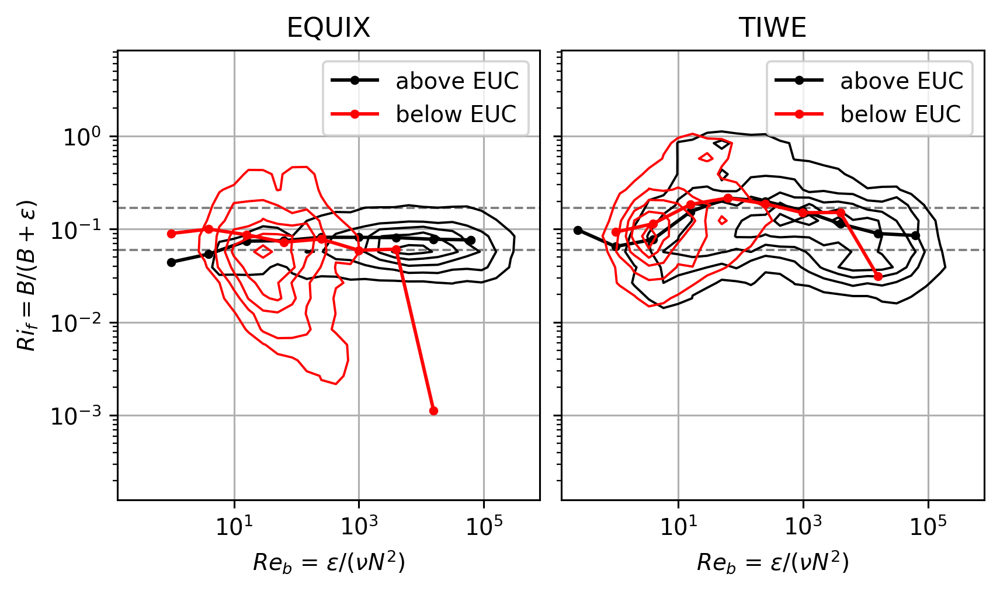

In [6]:
f, ax = plt.subplots(1, 2, sharex=True, sharey=True, constrained_layout=True)
pump.plot.plot_reb_rif(equix, ax=ax[0])
pump.plot.plot_reb_rif(tiwe, ax=ax[1])
f.set_size_inches((6, 3.5))
dcpy.plots.clean_axes(ax)

Text(0.5, 0, 'log($Re_b$)')

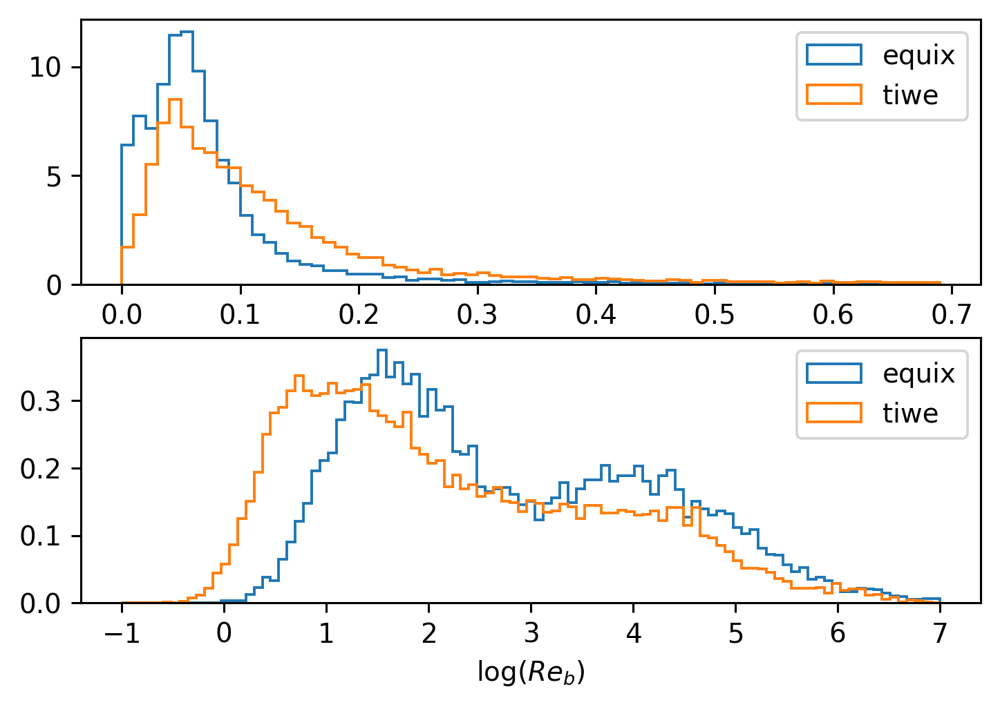

In [7]:
f, ax = plt.subplots(2, 1, sharex=False, sharey=False)
kwargs = dict(bins=np.arange(0, 0.7, 0.01), histtype="step", density=True)
equix.Rif.plot.hist(**kwargs, label="equix", ax=ax[0])
tiwe.Rif.plot.hist(**kwargs, label="tiwe", ax=ax[0])
ax[0].legend()

kwargs = dict(bins=np.linspace(-1, 7, 100), histtype="step", density=True)
np.log10(equix.Reb).plot.hist(**kwargs, label="equix", ax=ax[1])
np.log10(tiwe.Reb).plot.hist(**kwargs, label="tiwe", ax=ax[1])
ax[1].legend()
ax[1].set_xlabel("log($Re_b$)")

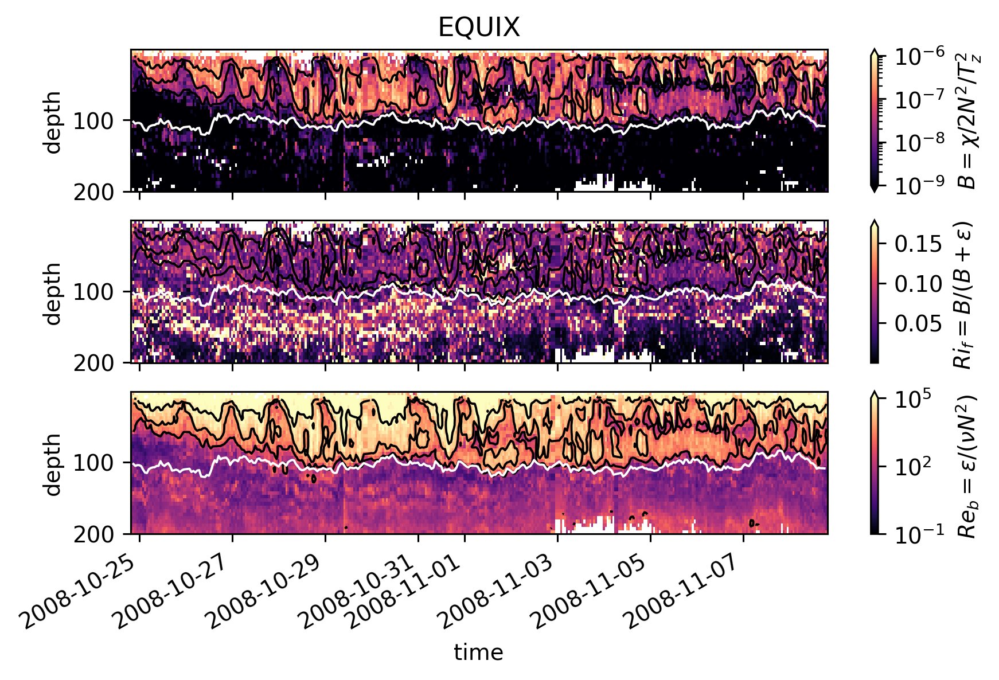

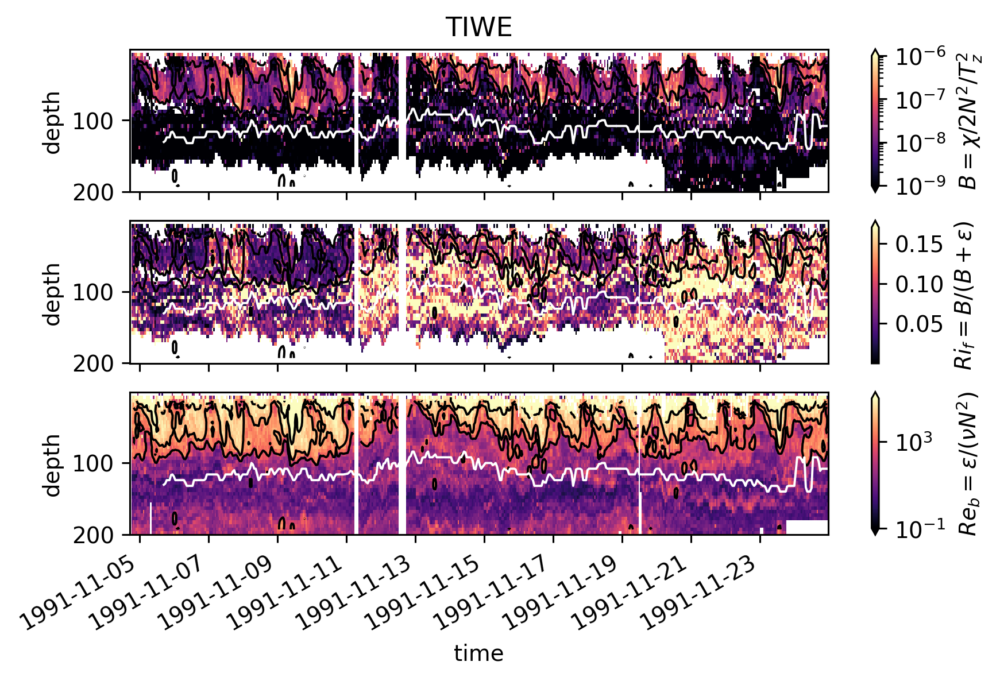

In [8]:
pump.plot.plot_mixing_diagnostics_timeseries(equix, coarsen=False)
pump.plot.plot_mixing_diagnostics_timeseries(tiwe, coarsen=False)

## EQUIX more closely

First I divide the timeseries into a few periods (period = time instants where red line is flat). Then look at profiles of quantities averaged over those  periods.

It turns out this is slightly misleading.

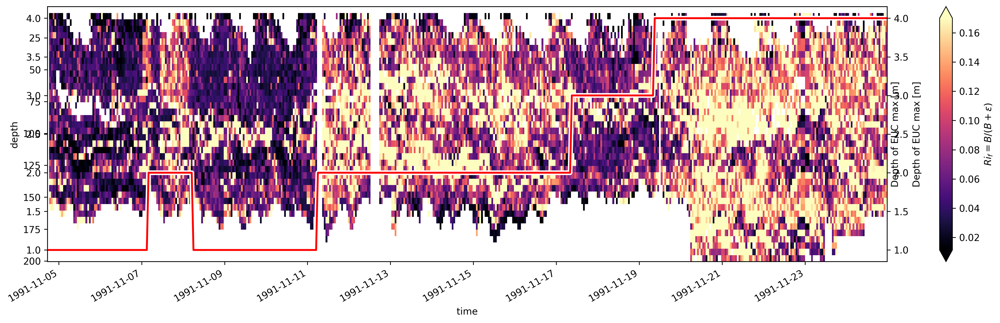

In [16]:
section = xr.full_like(tiwe.eucmax, fill_value=np.nan)

breaks = [None, "1991-11-07 04:00", "1991-11-08 06:00", "1991-11-11 06:00", "1991-11-17 09:00", "1991-11-19 09:00", None]
labels = [1, 2, 1, 2, 3, 4]

for label, left, right in zip(labels, breaks[:-1], breaks[1:]):
    section.loc[{"time": slice(left, right)}] = label

tiwe.coords["section"] = section
tiwe.Rif.cf.plot(x="time", robust=True, cmap=mpl.cm.magma, vmax=0.17, size=5, aspect=4)
section.plot(ax=plt.gca().twinx(), color='w', lw=5)
section.plot(ax=plt.gca().twinx(), color='r', lw=2)

1. It looks like the periods 1, 3, 4 (with the subsurface max in $Ri_f$) have a subsurface salinity max intrusion that might be limiting the deep-cycle. 
1. Period 2 where most of the water column has high $Ri_f$ looks weird in the profiles
    1. BUT note that the base of the DCL seems to change quite a bit so the averaging might be confusing things
    1. pretty broad Salinity intrusion below ~50m; $Ri_f$ is relatively higher.
1. Peak $Ri_f$ is just above the salinity max (or at the base of the DCL).
1. There is a strong gradient in ε, χ (base of the DCL)
1. But I see no sign in N^2?
1. Coincides with $Re_b$ decreasing below 10^3 threshold for periods 1, 4; for period 3 the $Re_b < 1000$


/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)


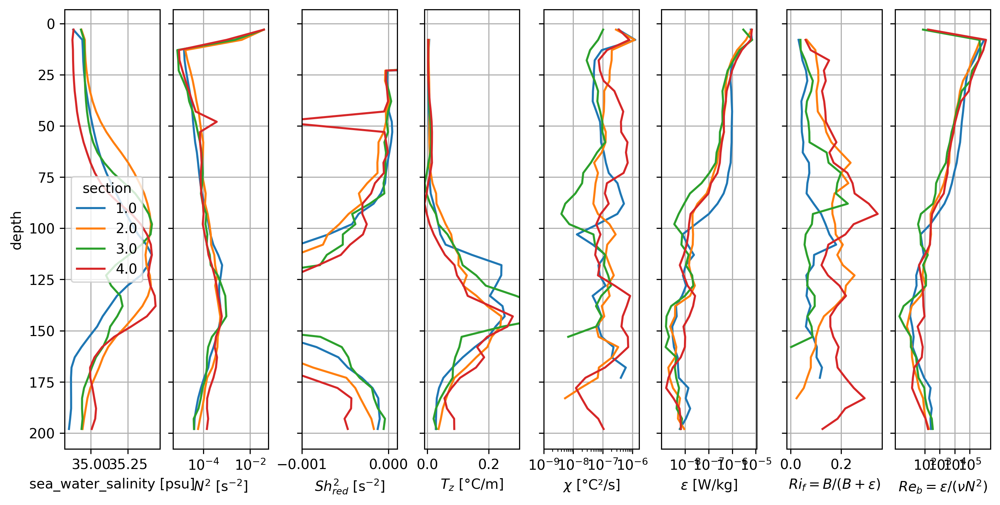

In [18]:
grouped = flox.xarray.xarray_reduce(tiwe, "section", func="mean")

grouped.theta.attrs["long_name"] = "$θ$"
grouped["chi"] = grouped.chi.where(grouped.chi > 1e-9)
names = ["salt", "N2", "shred2", "dTdz", "chi", "eps", "Rif", "Reb"]
logx = ["chi", "eps", "Reb"]
linearx = ["Rif", "theta", "salt", "dTdz", "shred2"]
f, axx = plt.subplots(
    1, len(names), sharey=True, constrained_layout=True, squeeze=False
)
ax = dict(zip(names, axx.squeeze()))
for name, axis in ax.items():
    (grouped[name]).cf.plot.line(
        ax=axis,
        add_legend=name == names[0],
        xscale="linear" if name in linearx else "log",
    )
    axis.grid(True)
f.set_size_inches((10, 5))
dcpy.plots.clean_axes(axx)
ax["chi"].set_xticks([1e-9, 1e-8, 1e-7, 1e-6])
ax["eps"].set_xticks([1e-8, 1e-7, 1e-6, 1e-5])
ax["dTdz"].set_xlim([-1e-2, 0.3])
ax["shred2"].set_xlim([-1e-3, 1e-4])
ax["Reb"].set_xticks([1e2, 1e3, 1e4, 1e5]);

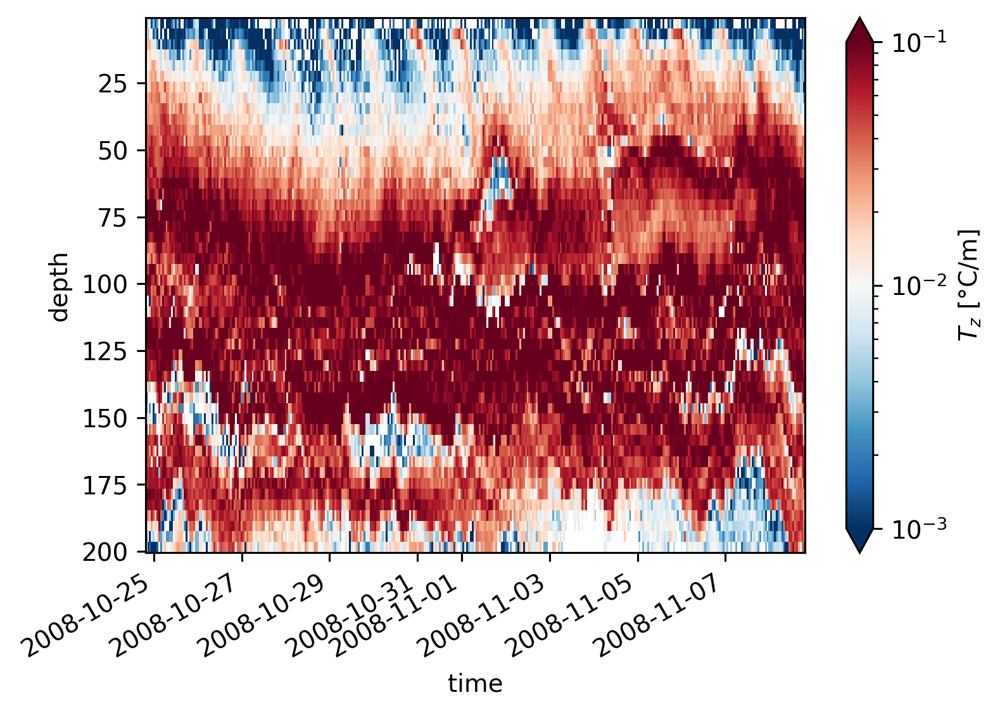

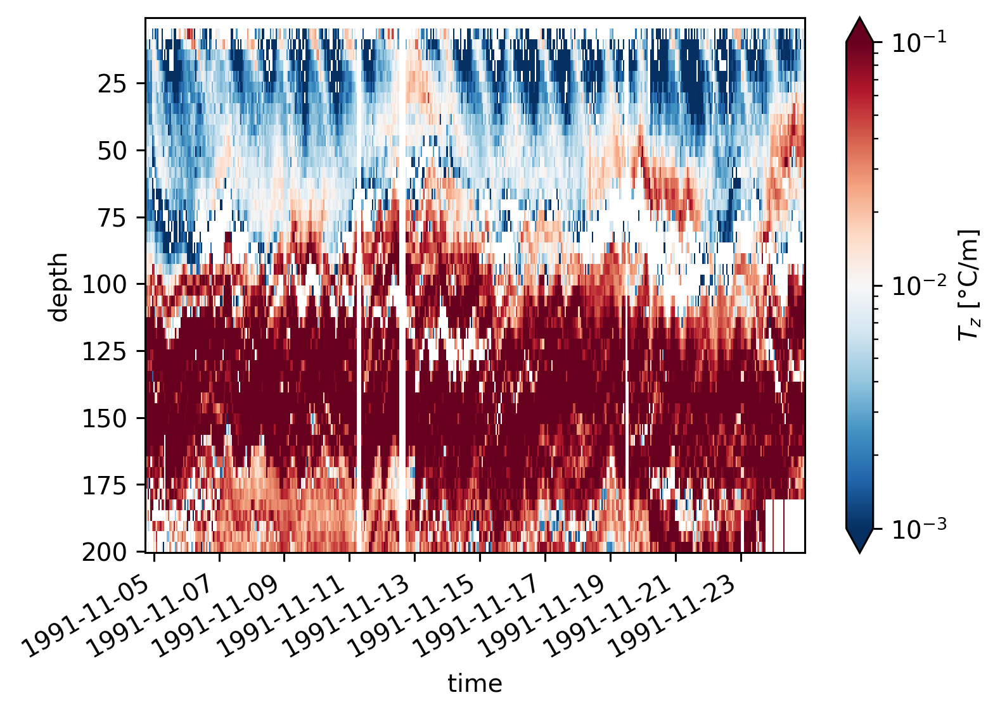

In [282]:
equix.dTdz.cf.plot(norm=mpl.colors.LogNorm(1e-3, 1e-1))
plt.figure()
tiwe.dTdz.cf.plot(norm=mpl.colors.LogNorm(1e-3, 1e-1))

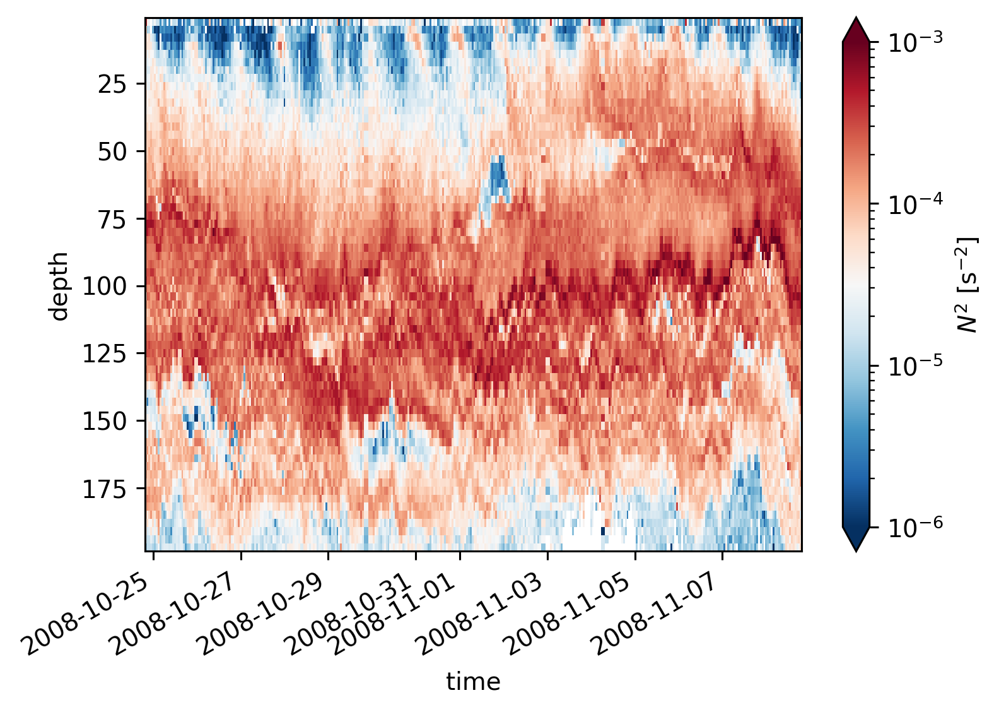

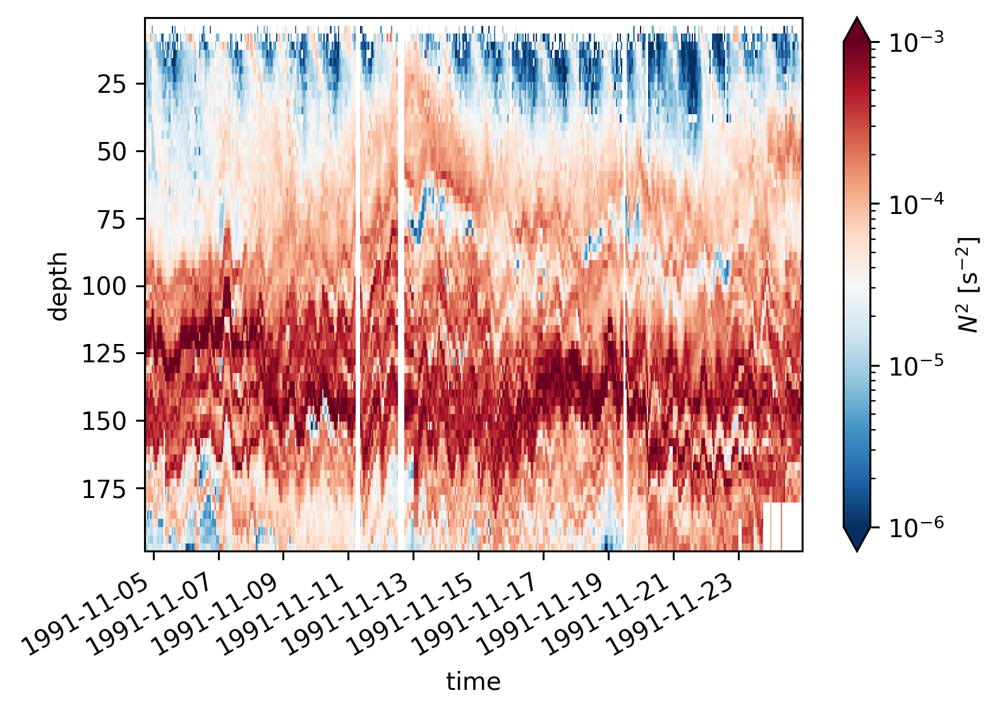

In [293]:
equix.N2.cf.plot(norm=mpl.colors.LogNorm(1e-6, 1e-3))
plt.figure()
tiwe.N2.cf.plot(norm=mpl.colors.LogNorm(1e-6, 1e-3))

posx and posy should be finite values
posx and posy should be finite values


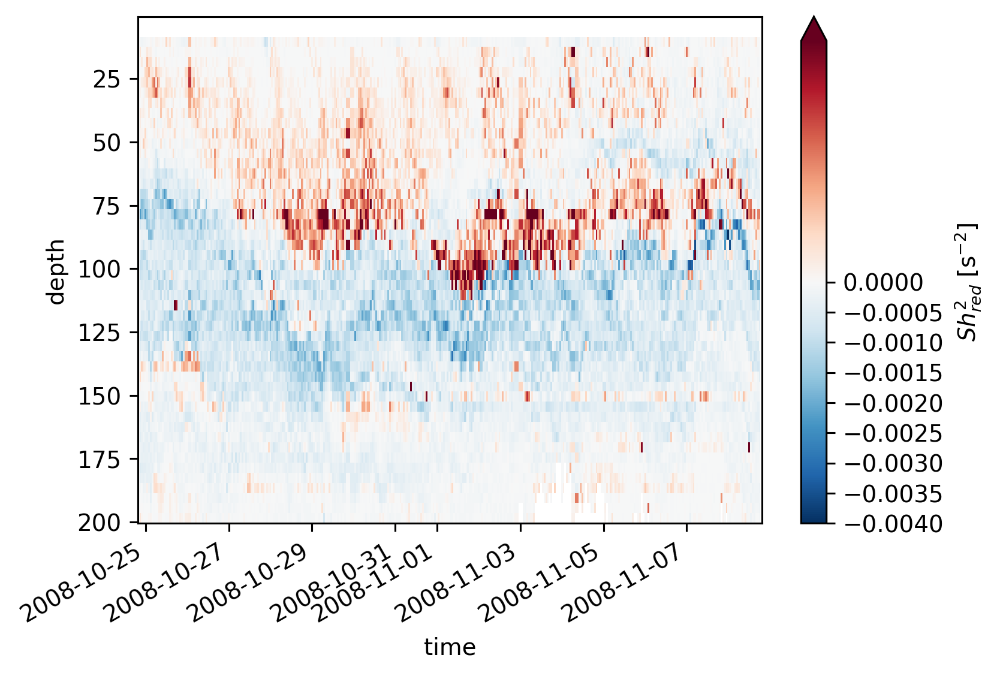

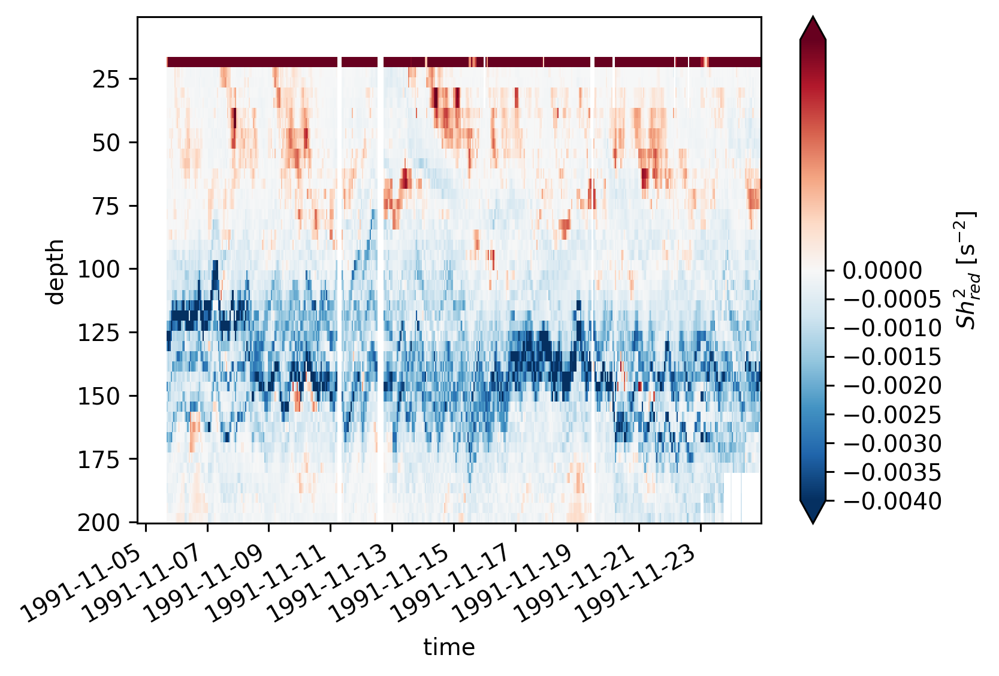

In [273]:
equix.shred2.cf.plot(norm=mpl.colors.TwoSlopeNorm(vmin=-4e-3, vcenter=0, vmax=5e-4))
plt.figure()
tiwe.shred2.cf.plot(norm=mpl.colors.TwoSlopeNorm(vmin=-4e-3, vcenter=0, vmax=5e-4))

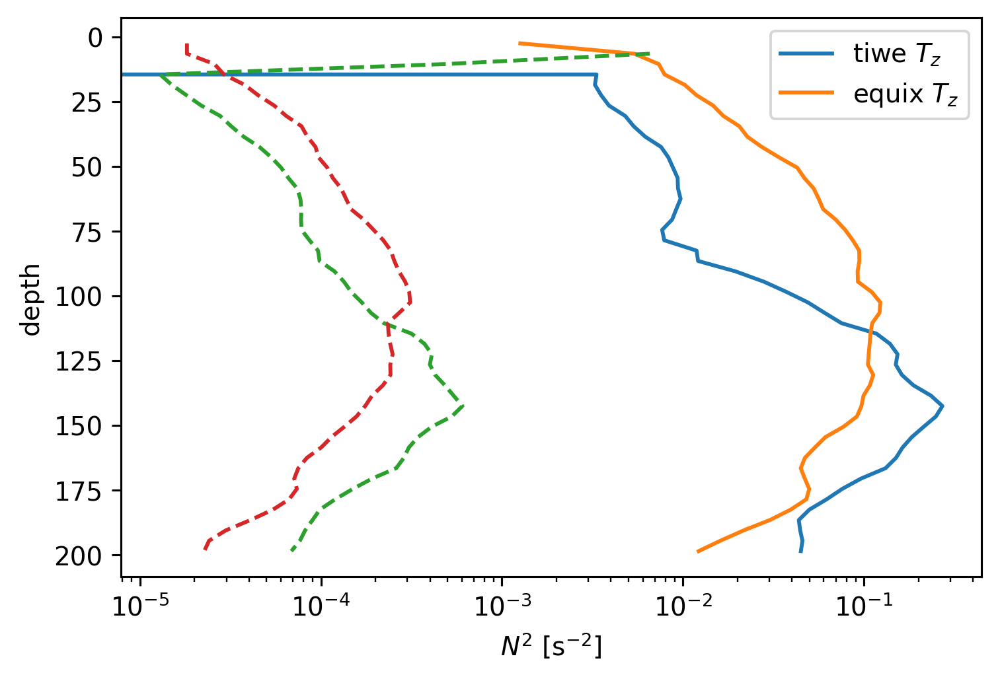

In [216]:
tiwe.dTdz.mean("time").cf.plot.line(label="tiwe $T_z$")
equix.dTdz.mean("time").cf.plot.line(label="equix $T_z$")

tiwe.N2.mean("time").cf.plot.line(ls="--")
equix.N2.mean("time").cf.plot.line(xscale="log", ls="--")
plt.legend()